# Midterm - Environmental & Health Impacts of Warehouses in Ontario, CA

## Research Question

Our project seeks to explore the relationship between warehouses and environmental, social, and health outcomes in the communities surrounding them in Ontario, California.

[Link to project proposal](https://github.com/rg-al/UP221-cargo/blob/main/Project%20Materials/ProjectPrososal.ipynb)

## Data Sources

[Environmental Justice Index](https://onemap.cdc.gov/portal/apps/sites/#/eji-explorer)(EJI)

The EJI is a newer index administered by the CDC that provides information on what communities experience severe cumulative impacts from environmental burden. This dataset provides environmental, social, and health data that we use to identify the causes of vulnerability for the communities in Ontario. Selected indicators from this dataset can be overlaid with warehouse data to identify a link between the growth of warehouses in the area and environmental justice burdens.

[Warehouse CITY data](https://radicalresearch.shinyapps.io/WarehouseCITY/)

The Warehouse CITY (communitY Cumulative Impact Tool) data data currently contains information on assessor parcel number, year built, and type. This data is collected with the purpose of providing a tool to help communities in Southern California understand and quantify the cumulative impacts of warehouses in the region. 

[California State Geoportal](https://gis.data.ca.gov/)

This dataset provides access to various geospatial data and services related to the state of California, including data on topography, demographics, land use, natural resources, and other related topics. We downloaded geojson files of Ontario city’s schools, parks, the airport, or any public places to see their locations and how warehouses may possibly impact people using these facilities.

## Data exploration

Exploring basic information of all the data of EJI, warehouses, and related facilities of Ontario city.  

In [1]:
#importing the neccesary libraries

import pandas as pd
import geopandas as gpd
import plotly as plt
import folium 
import matplotlib.pyplot as mplt
import contextily as ctx
from shapely import wkt
from shapely.wkt import loads
import plotly.express as px
import osmnx as ox

### Environmental and Health Data Exploration
---
 Loading cleaned, filtered, and merged Environmental Justice Index and Census Tract data
 
 See ['EJIData.ipynb'](https://jupyter.idre.ucla.edu/user/alrg@ucla.edu/lab/tree/UP221-cargo/Project%20Materials/EJIData.ipynb) notebook for full process

In [2]:
# Importing EJI file

EJI =gpd.read_file('../Project Materials/EJIselectdata.geojson')
EJI.head()

,state code,county code,affgeoid,geoid,county,location,total population,day population,EJI rank,Environmental burden rank,...,"% households < $75,000",% uninsured,% no internet,% age 65+,% age 17 or younger,% with disability,% limited english,% mobile home,% group quarters,geometry
0,06,071,1400000US06071001307,06071001307,San Bernardino,"Census Tract 13.07, San Bernardino County, Calif",4212,2345,0.6649,0.8834,...,39.6300,10.6,14.3,9.1,26.3,8.9,10.3,0.0,0.2,"POLYGON ((-117.62857 34.09215, -117.62856 34.0..."
1,06,071,1400000US06071001703,06071001703,San Bernardino,"Census Tract 17.03, San Bernardino County, Calif",5680,2388,0.4366,0.6255,...,26.3285,7.0,5.6,13.6,19.4,7.8,8.1,10.8,0.6,"POLYGON ((-117.66764 34.03029, -117.66760 34.0..."
2,06,071,1400000US06071001812,06071001812,San Bernardino,"Census Tract 18.12, San Bernardino County, Calif",3477,2913,0.9054,0.9883,...,53.0762,13.0,26.5,11.1,26.0,11.4,18.2,0.0,1.8,"POLYGON ((-117.65077 34.04925, -117.65074 34.0..."
3,06,071,1400000US06071001002,06071001002,San Bernardino,"Census Tract 10.02, San Bernardino County, Calif",5929,1960,0.6587,0.7748,...,49.3195,13.9,24.3,6.4,30.3,7.2,13.3,0.0,0.0,"POLYGON ((-117.68082 34.07406, -117.68082 34.0..."
4,06,071,1400000US06071001310,06071001310,San Bernardino,"Census Tract 13.10, San Bernardino County, Calif",6193,2689,0.7382,0.9542,...,34.8688,6.4,13.6,12.1,27.3,10.2,12.5,0.9,3.2,"POLYGON ((-117.64145 34.08708, -117.64144 34.0..."


In [3]:
# Setting the crs to epsg:4326
EJI.crs = 'epsg:4326'

### Ontario Land Use Data Exploration


In [4]:
#defining the area of interest with an address
address = 'Ontario International Airport, Vineyard Avenue, Racimo, Ontario, San Bernardino County, California, 91761, United States'

In [5]:
#obtaining building data from OSM for the entire city
osm = ox.geometries_from_address(address,tags={'building':True},dist=5000)

In [6]:
#getting more info on the dataset
#determining hoow many rows/columns
osm.shape
#this dataset has 8264 rows and 133 columns

(3119, 130)

In [7]:
#determining datatype
type(osm)

geopandas.geodataframe.GeoDataFrame

In [8]:
#displaying 10 random rows
osm.sample(10)

addr:state building  ele gnis:county_name  \
element_type osmid                                                  
way          25454501          NaN      yes  NaN              NaN   
             631844900         NaN      yes  NaN              NaN   
             740844664         NaN      yes  NaN              NaN   
             1110047257        NaN      yes  NaN              NaN   
node         521514019          CA    house  NaN              NaN   
way          993191489         NaN      yes  NaN              NaN   
             736377754         NaN    house  NaN              NaN   
             736697530         NaN    house  NaN              NaN   
             736377759         NaN    house  NaN              NaN   
node         519635320          CA      yes  NaN              NaN   

                        gnis:feature_id gnis:reviewed name  \
element_type osmid                                           
way          25454501               NaN           NaN  NaN   
             631844900              NaN           NaN  NaN   
             740844664              NaN           NaN  NaN   
             1110047257             NaN           NaN  NaN   
node         521514019              NaN           NaN  NaN   
way          993191489              NaN           NaN  NaN   
             736377754              NaN           NaN  NaN   
             736697530              NaN           NaN  NaN   
             736377759              NaN           NaN  NaN   
node         519635320              NaN           NaN  NaN   

                                                             source  \
element_type osmid                                                    
way          25454501                                           NaN   
             631844900                                          NaN   
             740844664                                          NaN   
             1110047257                microsoft/BuildingFootprints   
node         521514019                    survey;image;usgs_imagery   
way          993191489                                          NaN   
             736377754                                          NaN   
             736697530                                          NaN   
             736377759                                          NaN   
node         519635320   survey;image;yahoo_imagry;local_government   

                                                                  geometry  \
element_type osmid                                                           
way          25454501    POLYGON ((-117.61758 34.05137, -117.61652 34.0...   
             631844900   POLYGON ((-117.58000 34.08692, -117.58000 34.0...   
             740844664   POLYGON ((-117.64935 34.06305, -117.64929 34.0...   
             1110047257  POLYGON ((-117.59024 34.03976, -117.59283 34.0...   
node         521514019                         POINT (-117.59600 34.02231)   
way          993191489   POLYGON ((-117.59779 34.09898, -117.59752 34.0...   
             736377754   POLYGON ((-117.64673 34.02552, -117.64658 34.0...   
             736697530   POLYGON ((-117.64975 34.02292, -117.64959 34.0...   
             736377759   POLYGON ((-117.64765 34.02512, -117.64753 34.0...   
node         519635320                         POINT (-117.54558 34.08144)   

                                addr:city  ... content generator:method  \
element_type osmid                         ...                            
way          25454501                 NaN  ...     NaN              NaN   
             631844900                NaN  ...     NaN              NaN   
             740844664                NaN  ...     NaN              NaN   
             1110047257               NaN  ...     NaN              NaN   
node         521514019            Ontario  ...     NaN              NaN   
way          993191489                NaN  ...     NaN              NaN   
             736377754                NaN  ...     NaN      

In [9]:
#exploring column categories in order to find out what columns should be eliminated
osm.info(verbose=True,show_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
MultiIndex: 3119 entries, ('node', 368173617) to ('relation', 15511540)
Data columns (total 130 columns):
 #    Column                          Non-Null Count  Dtype   
---   ------                          --------------  -----   
 0    addr:state                      334 non-null    object  
 1    building                        3119 non-null   object  
 2    ele                             8 non-null      object  
 3    gnis:county_name                3 non-null      object  
 4    gnis:feature_id                 9 non-null      object  
 5    gnis:reviewed                   3 non-null      object  
 6    name                            280 non-null    object  
 7    source                          432 non-null    object  
 8    geometry                        3119 non-null   geometry
 9    addr:city                       349 non-null    object  
 10   addr:housenumber                361 non-null    object  
 11   addr:street            

In [10]:
#subsetting the data and defining which columns to keep
ctk=['geometry','building']
osm=osm[ctk]
osm.head(10)

geometry building
element_type osmid                                          
node         368173617  POINT (-117.65043 34.09696)      yes
             479791356  POINT (-117.54560 34.08149)      yes
             479791359  POINT (-117.54563 34.08115)      yes
             479791362  POINT (-117.54570 34.08083)      yes
             518277168  POINT (-117.57604 34.08489)      yes
             518277169  POINT (-117.57537 34.08804)      yes
             518277174  POINT (-117.57559 34.09250)      yes
             518277175  POINT (-117.57559 34.09311)      yes
             518277177  POINT (-117.57559 34.09358)      yes
             518277178  POINT (-117.57560 34.09416)      yes

'ctk' dataframe has been subset to 'element_type', 'osmid', 'geometry', and 'building'

#### Warehouse Data Exploration

In [11]:
#loading first data file on warehouse information
wh = pd.read_csv('../weekly tasks/week 4/W4-Georgie/warehouse (1).csv')

wh.head()

,Assessor parcel number,Building classification,Year built,Acres,Building sq.ft.
0,051513138,storage building,2021,275,7778022
1,046323158,distribution warehouse,2003,225,6381893
2,049202124,storage warehouse,2016,151,4273702
3,668280017,warehouse/dry storage,1910,128,3633789
4,046323161,distribution warehouse,2018,106,3014158


In [12]:
#Trying to find average acreage per warehouse
wh['Acres'].mean()

5.871236928277173

In [13]:
#finding the median
wh['Acres'].median()

3.0

In [14]:
#generating statistics for acreage
wh['Acres'].describe()

count    9467.000000
mean        5.871237
std         9.138117
min         1.000000
25%         2.000000
50%         3.000000
75%         6.000000
max       275.000000
Name: Acres, dtype: float64

In [15]:
#sorting warehouses by acreage size
wh.sort_values(by='Acres', ascending=False)
wh.head()

,Assessor parcel number,Building classification,Year built,Acres,Building sq.ft.
0,051513138,storage building,2021,275,7778022
1,046323158,distribution warehouse,2003,225,6381893
2,049202124,storage warehouse,2016,151,4273702
3,668280017,warehouse/dry storage,1910,128,3633789
4,046323161,distribution warehouse,2018,106,3014158


In [16]:
#sorting warehouses by year built
wh.sort_values(by='Year built', ascending=True)
wh.head()

,Assessor parcel number,Building classification,Year built,Acres,Building sq.ft.
0,051513138,storage building,2021,275,7778022
1,046323158,distribution warehouse,2003,225,6381893
2,049202124,storage warehouse,2016,151,4273702
3,668280017,warehouse/dry storage,1910,128,3633789
4,046323161,distribution warehouse,2018,106,3014158


In [17]:
#removing 1910 value (which is used to indicate unknown warehouse construction date
wh.drop(wh.loc[wh['Year built']==1910].index, inplace=True)

In [18]:
#checking for empty values
wh.columns[wh.isna().all()].tolist()

[]

In [19]:
#filtering out unwanted columns
desired_columns=['Acres','Year built', 'Building sq.ft.']

In [20]:
#creating a copy so that the table doesn't revert to the original data
wh_new=wh[desired_columns].copy()
wh_new.head()

,Acres,Year built,Building sq.ft.
0,275,2021,7778022
1,225,2003,6381893
2,151,2016,4273702
4,106,2018,3014158
5,106,1941,2990190


The dataframe of warehouses have been cleaned up to only information of acres, year built, and building sq.ft.

## Analysis

#### Bring in Warehouse data

In [21]:
# See all the columns and rows.
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Import warehouse data and convert the datatype of 'Assessor parcel number' and 'Building classification' from 'int' or 'float' to 'str'
             
Warehouses = pd.read_csv('../weekly tasks/week 4/Warehouse Data Exploration - Matthews/Data/Warehouse_Data.csv',
        dtype=
        {
            'Assessor parcel number':str,
            'Building classification':str,
        }
)

San_Bern_Parcels = gpd.read_file('../weekly tasks/week 4/Warehouse Data Exploration - Matthews/Data/Ontario Parcels/SBCo_Parcel_Polygons.shp')

San_Bern_Parcels.rename(columns = {'ParcelNumb':'Assessor parcel number'}, inplace = True)

#merge the warehouses and parcel shapefile on the San Bernandino County Tax Assessor parcel Number
Warehouse_Parcel=Warehouses.merge(San_Bern_Parcels,on="Assessor parcel number")
Warehouse_Parcel_Geo = gpd.GeoDataFrame(Warehouse_Parcel, geometry='geometry', crs="EPSG:4326")

### Charts

#### Simple bar chart with plot

Charts for environmental data

In [22]:
# Subset the EJ variables to only fips code and air pollution  

EJIdata2_pollution = EJI[['geoid','Ozone rank', 'PM 2.5 rank', 'Diesel rank','Air toxics cancer risk']]
EJIdata2_pollution.head()
EJIdata2_pollution.sort_values(by='PM 2.5 rank', ascending=False).head(5)

,geoid,Ozone rank,PM 2.5 rank,Diesel rank,Air toxics cancer risk
16,06071001903,0.9865,0.9955,0.7307,0.8310
36,06071001906,0.9935,0.9955,0.8541,0.8709
17,06071001905,0.9894,0.9953,0.8064,0.8851
29,06071002206,0.9938,0.9948,0.8882,0.9165
18,06071001809,0.9930,0.9947,0.8919,0.9207


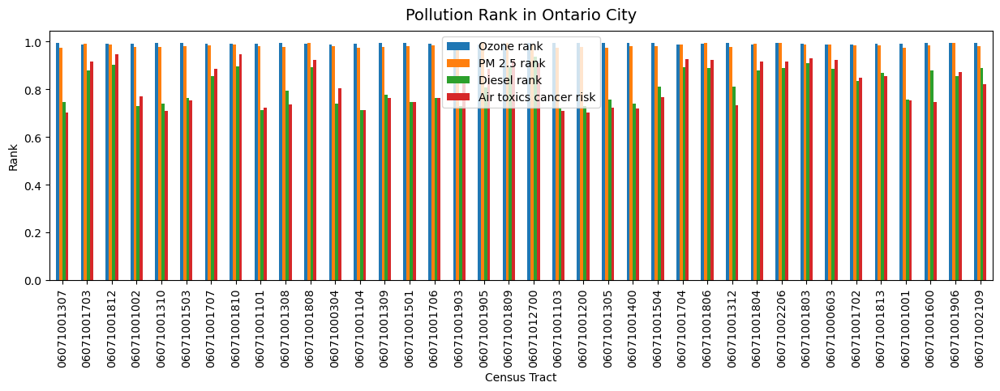

In [23]:
# Create bar chart of all air pollution 
fig, ax = mplt.subplots(figsize=(15,4))

EJIdata2_pollution.plot.bar(ax=ax,
                                      x='geoid',
                                      legend=True,
                                      )
ax.set_xlabel('Census Tract') # override x label
ax.set_ylabel('Rank') # override y label
ax.set_title("Pollution Rank in Ontario City",fontsize=14,pad=10); # multi-line title with padding

A static bar chart demonstrating all air pollution rank of each census tract in Ontario city.

<AxesSubplot: xlabel='geoid'>

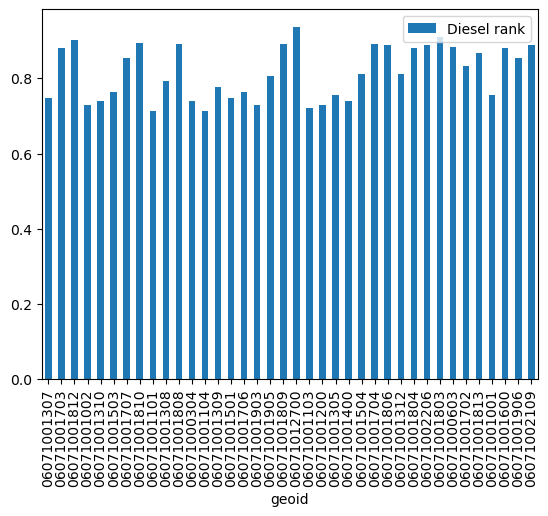

In [24]:
# Create bar chart of diesel rank

EJIdata3_diesel = EJI[['geoid','Diesel rank']]
EJIdata3_diesel.plot.bar(x='geoid')

The bar chart does not look good. Let's create a better one!

#### Interactive bar chart with plotly
Environmental data

In [25]:
# Subset dataframe and sort it 
# keep only fips code and diesel rank

EJIdata3_diesel.sort_values(by='Diesel rank', ascending=False, inplace = True)
EJIdata3_diesel.head()

/tmp/ipykernel_1364/3062379244.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  EJIdata3_diesel.sort_values(by='Diesel rank', ascending=False, inplace = True)


,geoid,Diesel rank
19,06071012700,0.9367
30,06071001803,0.9109
2,06071001812,0.9018
7,06071001810,0.8955
10,06071001808,0.8919


/opt/conda/lib/python3.10/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



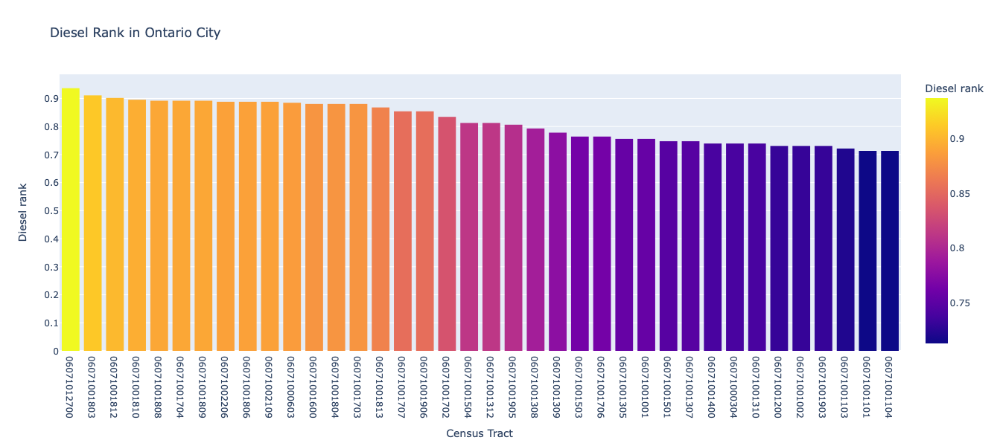

In [26]:
# Create interactive bar chart

# for interactive plots


# add labels by providing a dict
fig = px.bar(
        EJIdata3_diesel,
        x='geoid',
        y='Diesel rank',
        color = 'Diesel rank',
        title='Diesel Rank in Ontario City',
        labels={
            'geoid':'Census Tract',       
        },
        height=600
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

Now we have a prettier and interactive bar chart which is easier to identify the diesel rank of all census tracts in Ontario city.  

#### Pie chart - Land Use Data

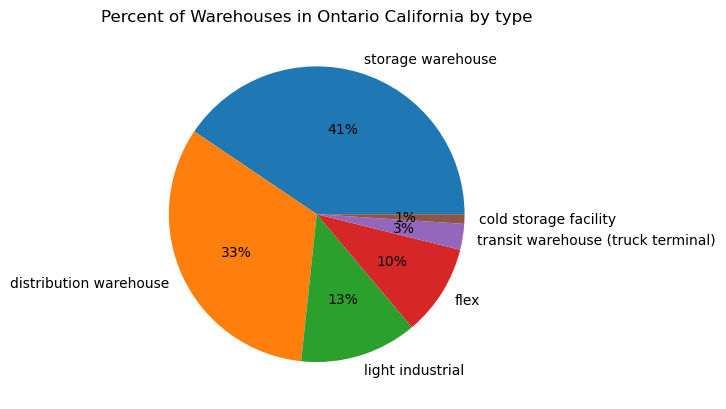

In [27]:
# Creating pie chart of warehouse types in Ontario
Warehouse_Parcel_count = Warehouse_Parcel['Building classification'].value_counts()
ax = Warehouse_Parcel_count.plot(kind='pie',title='Percent of Warehouses in Ontario California by type',autopct='%1.0f%%')
ax.get_yaxis().set_visible(False)

A pie chart showing the percentage of warehouse types in Ontario city. 

#### Bar chart - Land use data

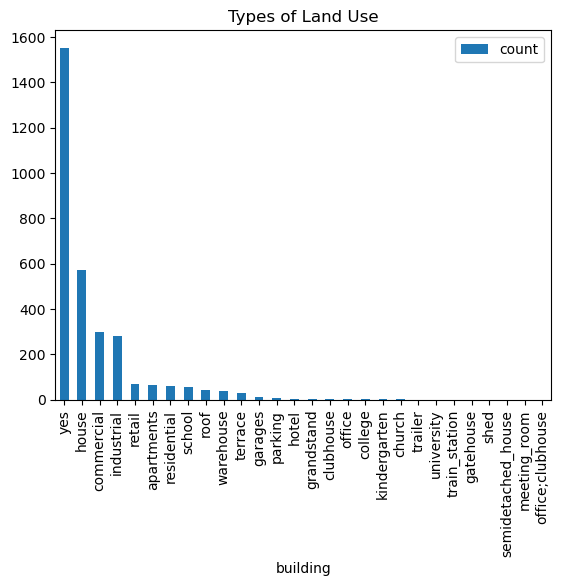

In [28]:
# Count the numbers of each building type.
osm_build_count=osm.value_counts(['building']).reset_index(name="count")
osm_build_count

#Visualizing the data through a bar chart
osm_build_count.plot.bar(x='building', title= 'Types of Land Use');

A bar chart showing the counts of each building type.

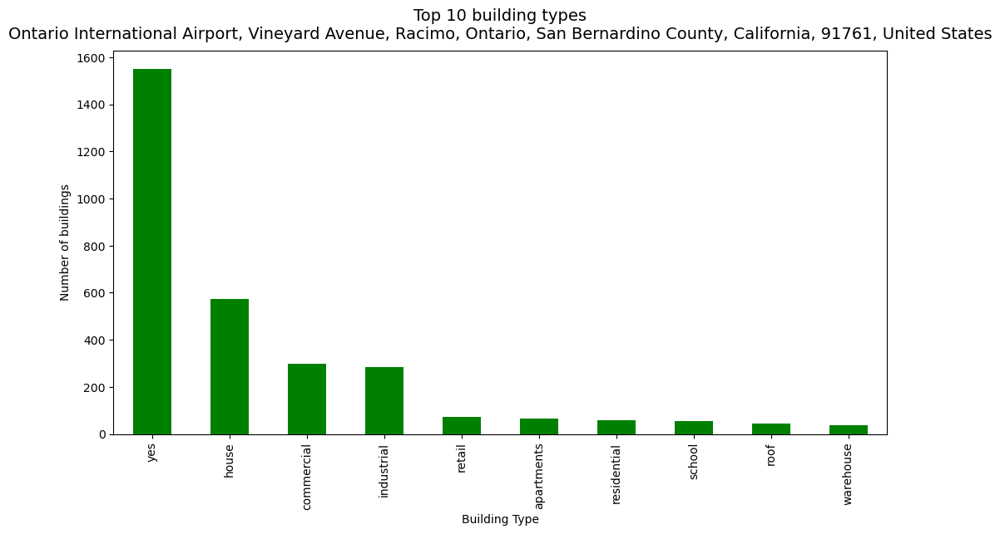

In [29]:
#creating another, more readable chart
fig, ax = mplt.subplots(figsize=(12,6))

osm_build_count[:10].plot.bar(ax=ax,
                                      x='building',
                                      y='count',
                                      legend=False,
                                      color='green'
                                      )
ax.set_xlabel('Building Type') # override x label
ax.set_ylabel('Number of buildings') # override y label
ax.set_title("Top 10 building types\n"+address,fontsize=14,pad=10); # multi-line title with padding

Adding title, labels of axis, and adjusting the width to make it more readable. 

/opt/conda/lib/python3.10/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



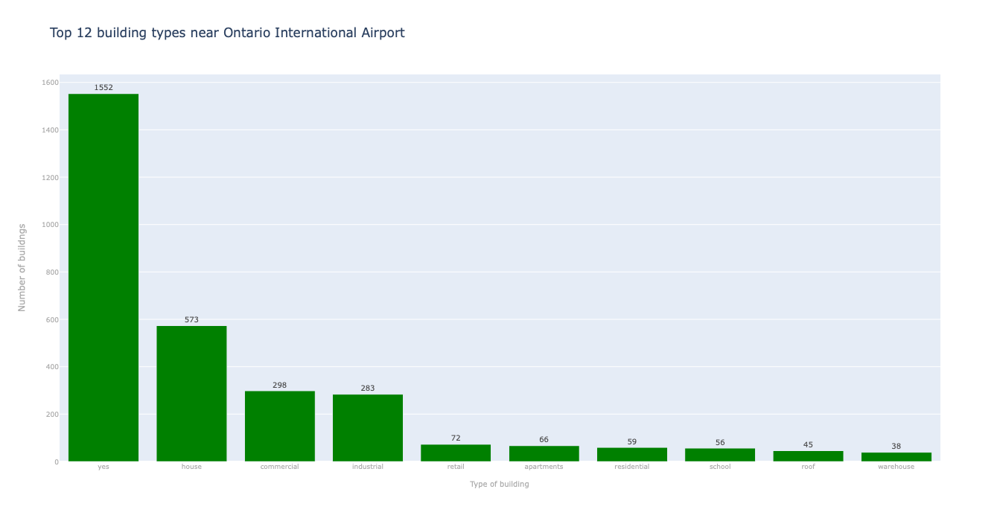

In [30]:
# creating a plotly graph
fig = px.bar(osm_build_count.head(10),
        x='building',
        y='count',
        title="Top 12 building types near Ontario International Airport", 
        text_auto = True,
        height=700,
        width=900,
        color_discrete_sequence =['green']*len(osm_build_count),
        labels={
                'count': 'Number of buildngs',
                'building': 'Type of building',
        })

# labeling the bar
fig.update_traces(textposition='outside',textfont_size=10,textfont_color='#444')

# labeling the axes
fig.update_yaxes(title_font_size=12,title_font_color='#aaa',tickfont_color='#aaa',tickfont_size=9)
fig.update_xaxes(title_font_size=10,title_font_color='#aaa',tickfont_color='#aaa',tickfont_size=9)

# show the figure
fig.show()

An interactive bar chart showing the counts of all building types.

#### Interactive Bar Chart - Warehouses over time

/opt/conda/lib/python3.10/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



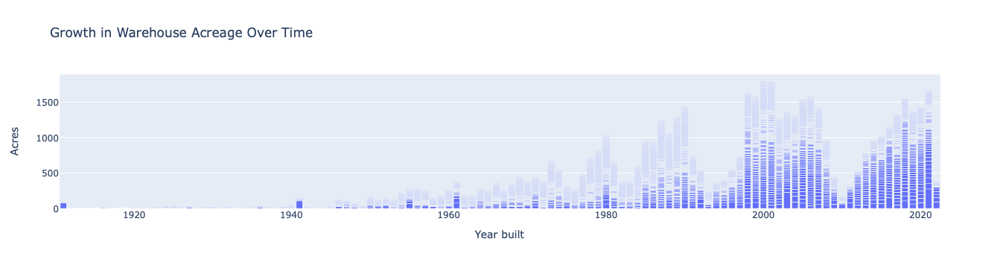

In [31]:
#use plotly to show how the the acreage per warehouse has increased over time
fig = px.bar(wh_new,
             x='Year built',
             y='Acres',
             title ='Growth in Warehouse Acreage Over Time'
            )
fig.show()

An interactive stacked bar chart showing the acres built in years. We can see that the size of each warehouse tend to be bigger in recent decades.  

/opt/conda/lib/python3.10/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



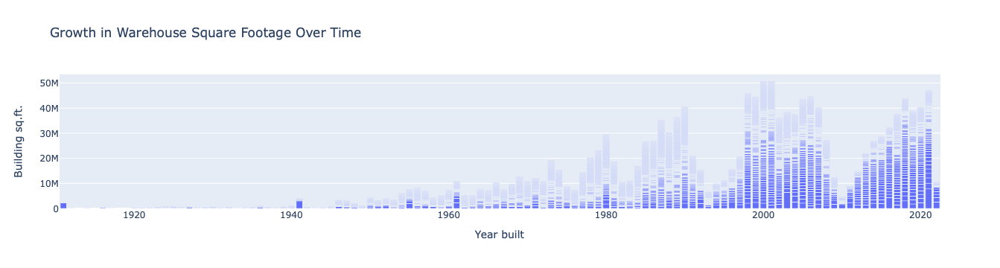

In [32]:
#trying to use plotly to show how the the acreage per warehouse has increased over time
fig = px.bar(wh_new,
             x='Year built',
             y='Building sq.ft.',
             title ='Growth in Warehouse Square Footage Over Time'
            )
fig.show()

An interactive stacked bar chart showing the building sq.ft of each warehouse in years. We can see that the total sq.ft.of each warehouse tend to be bigger in recent decades.

### Maps

#### Environmental & Health Data Maps

/tmp/ipykernel_1364/2297675882.py:31: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_1364/2297675882.py:31: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_1364/2297675882.py:31: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_1364/2297675882.py:31: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_1364/2297675882.py:31: UserWarning:

Geometry is in a geographic CRS. Results from 'c

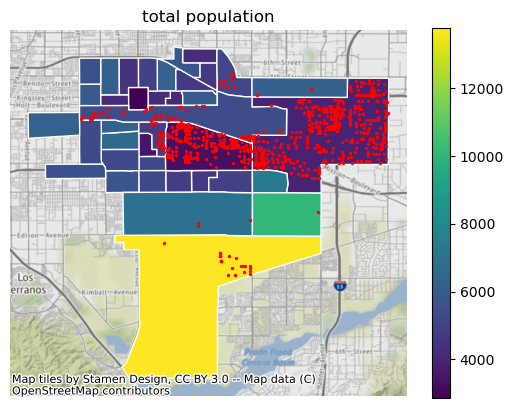

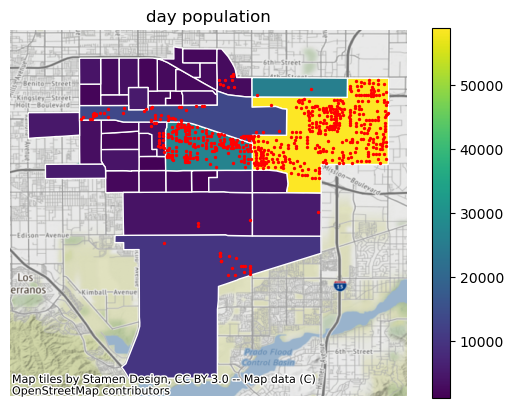

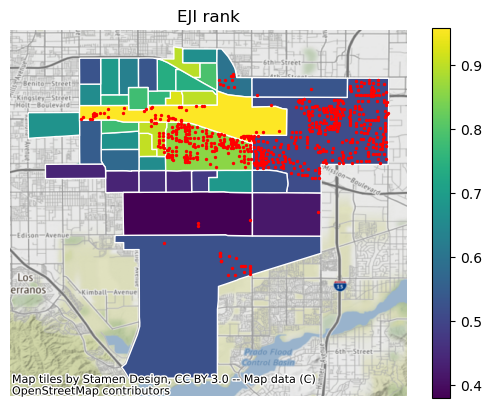

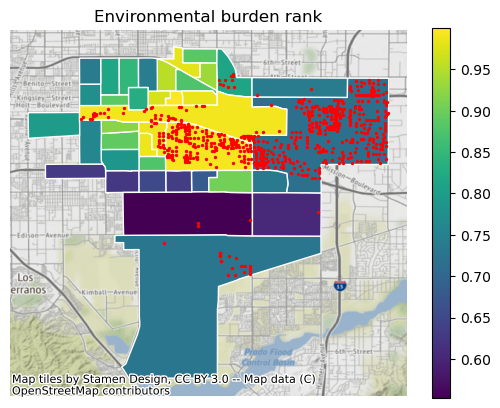

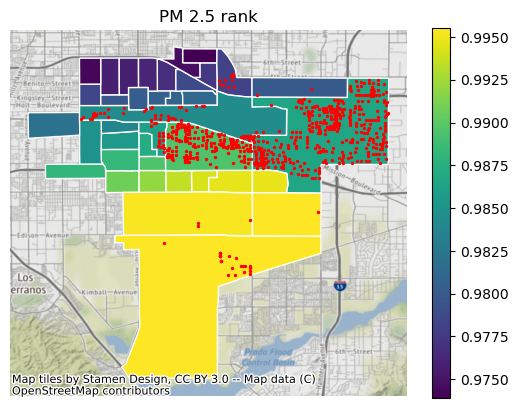

...

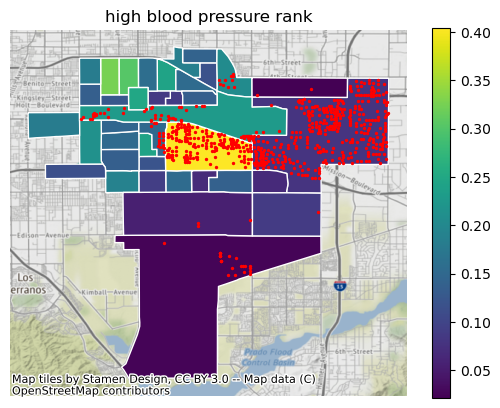

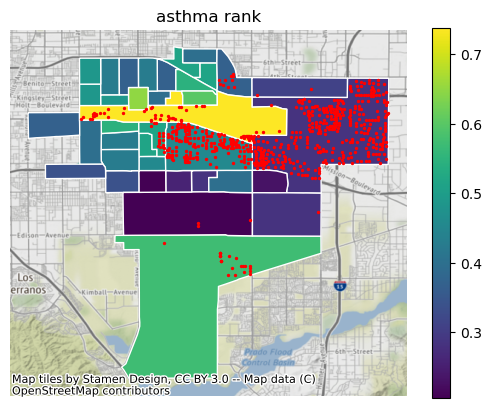

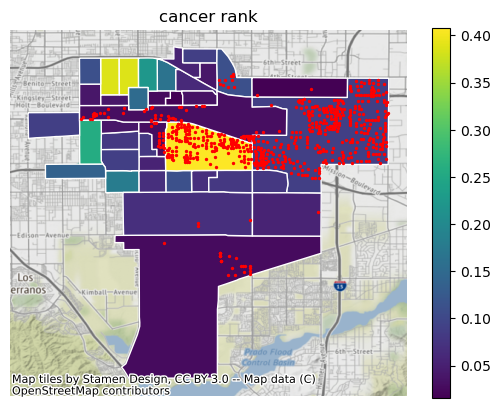

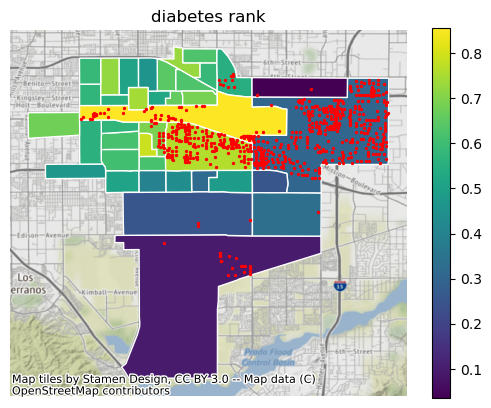

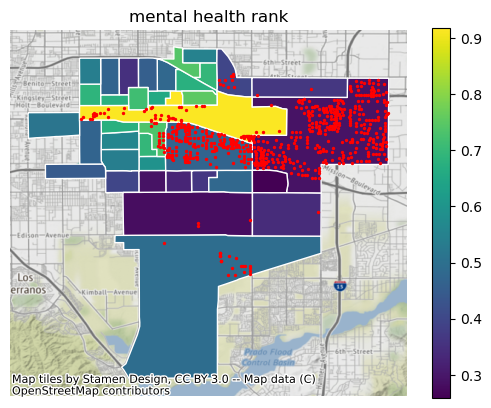

In [33]:
# using a loop to create the maps

variables = ['total population',
 'day population',
 'EJI rank',
 'Environmental burden rank',
 'PM 2.5 rank',
 'Diesel rank',
 'Air toxics cancer risk',
 'Lack of parks',
 'Lack of walkability',
 'railways',
 'high volume roads',
 'airports',
 'proximity to roads, rail, airports',
 'social vulnerability rank',
 '% high blood pressure',
 '% asthma',
 '% cancer',
 '% mental health',
 '% diabetes',
 'high blood pressure rank',
 'asthma rank',
 'cancer rank',
 'diabetes rank',
 'mental health rank']

# Loop the variables
for variable in variables:
    ax = EJI.plot(column=variable, edgecolor="white", legend=True)
    Warehouse_Parcel_Geo.centroid.plot(ax=ax, color='red',markersize=2);
    ax.set_title(variable)
    ax.set_axis_off()
    ctx.add_basemap(ax, crs=4326)

Now we have the static maps of all health, air pollution, and some EJ variables that showing their ranks and relationships with warehouses.   

#### Creating an Interactive Map of Desiel emisions in Ontario

Often times, its useful for urban planners to see the spatial relationships between infrastructture, ammentieies, and environmental conditions. To do this, we can use the Folium library along with our census tract data to create an interactive map. For this project, we would like to see the spatial relation between desiel emisions, the airport, public parks, and schools. Let's start by bringing in all our necessary data and python libraries.

In [34]:
# See all the columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Import the file and convert the datatypes
EJIdata3=pd.read_csv('../Data/EJI Variables and Warehouse Marked.csv')
EJIdata3['geometry'] = EJIdata3['geometry'].apply(wkt.loads)
EJIdata3 = gpd.GeoDataFrame(EJIdata3, geometry='geometry', crs="EPSG:4326")
airports=gpd.read_file('../Data/Airport_Schools_Parks_Location/Airport_Boundaries_Ontario.geojson')
parks=gpd.read_file('../Data/Airport_Schools_Parks_Location/CPAD_Shapes/CPAD_2022b_Holdings.shp')
schools=gpd.read_file('../Data/Airport_Schools_Parks_Location/California_Schools_2021-22_San Berdarnido.geojson')


Warehouses = pd.read_csv('../weekly tasks/week 4/Warehouse Data Exploration - Matthews/Data/Warehouse_Data.csv',
        dtype=
        {
            'Assessor parcel number':str,
            'Building classification':str,
        }
)

San_Bern_Parcels = gpd.read_file('../weekly tasks/week 4/Warehouse Data Exploration - Matthews/Data/Ontario Parcels/SBCo_Parcel_Polygons.shp')

San_Bern_Parcels.rename(columns = {'ParcelNumb':'Assessor parcel number'}, inplace = True)

#merge the warehouses and parcel shapefile on the San Bernandino County Tax Assessor parcel Number
Warehouse_Parcel=Warehouses.merge(San_Bern_Parcels,on="Assessor parcel number")
Warehouse_Parcel_Geo = gpd.GeoDataFrame(Warehouse_Parcel, geometry='geometry', crs="EPSG:4326")

Now using Folium, we can begin to explore the data that we have. We have to reproject the parks files as well, to keep in the system projection system as the other data.

In [35]:
schools=schools[schools['City']=='Ontario'];

parks.to_crs(epsg=4326, inplace=True);
parks1=parks[parks['CITY']=='Ontario'];
parks1["geometry"] = parks1["geometry"].centroid

/tmp/ipykernel_1364/1694539781.py:5: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [36]:
#start our map
m = folium.Map(location=[34.0633,-117.6509], 
               zoom_start = 11.5,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  geo_data=EJIdata3, # geo data
                  data=EJIdata3, # data          
                  key_on='feature.properties.geoid', # key, or merge column
                  columns=['geoid','Diesel rank'], # [key, value]
                  fill_color='BuPu',
                  line_weight=0.3, 
                  fill_opacity=0.6,
                  line_opacity=0.8, # line opacity (of the border)
                  legend_name='Diesel Emission Percentile Rank').add_to(m)    # name on the legend color bar
#Add the Airport in Red
folium.Marker([34.05627, -117.59574], popup='<i>Ontario Airport</i>', icon=folium.Icon(color="red")).add_to(m)

#Add the Schools in Blue
for index, row in schools.iterrows():
    # add folium marker code
    folium.Marker([row.geometry.y, row.geometry.x], popup=row.SchoolName, tooltip=row.SchoolName).add_to(m)
    
# Add the Parks in Green
for index, row in parks1.iterrows():
    # add folium marker code
    folium.Marker([row.geometry.y, row.geometry.x], popup=row.SITE_NAME, tooltip=row.SITE_NAME, icon=folium.Icon(color="green")).add_to(m)
    # add folium marker code
m

#### Land Uses Maps/Plots
Create a map to visualize the building land use in Ontario city.

<AxesSubplot: >

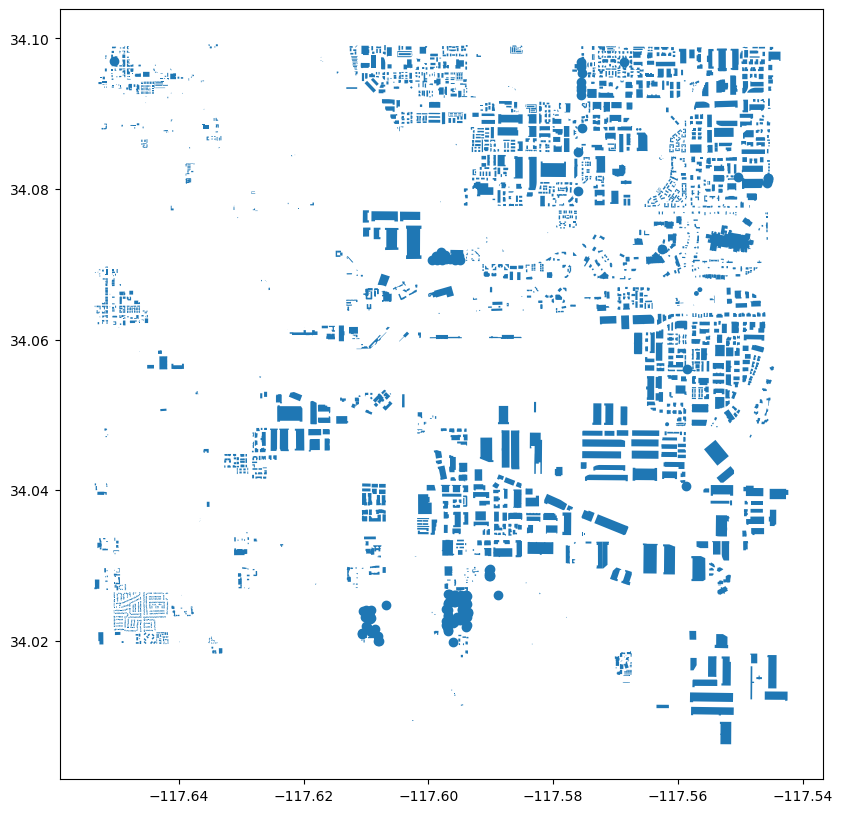

In [37]:
# Plot the osm dataframe, whichs contain the building types and geometry information

osm.plot(figsize=(10,10))

In [38]:
#removing unwanted building types using .loc
osm.drop(osm.loc[osm['building']=='trailer'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='church'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='clubhouse'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='garages'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='office;clubhouse'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='office'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='parking'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='college'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='gatehouse'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='hotel'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='roof'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='terrace'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='shed'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='meeting_room'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='grandstand'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='semidetached_house'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='train_station'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='kindergarten'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='commercial'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='apartments'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='retail'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='school'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='university'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='residential'].index,inplace=True)
osm.drop(osm.loc[osm['building']=='house'].index,inplace=True)

<AxesSubplot: >

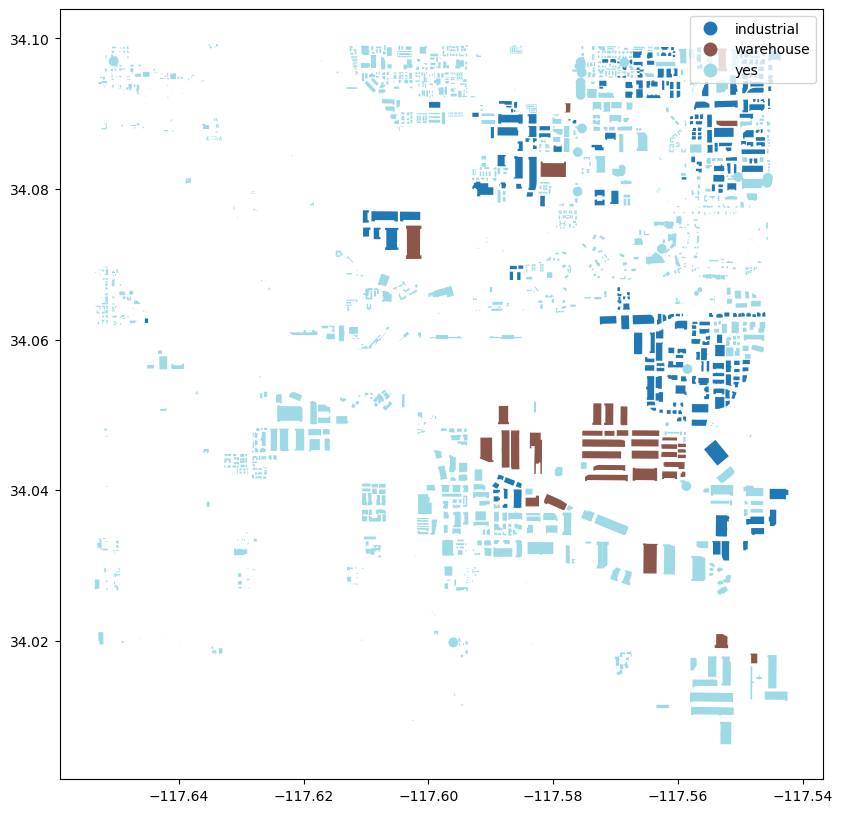

In [39]:
#trying to color code the buildings
osm.plot(figsize=(10,10),
         column='building',
         cmap='tab20',
         legend=True)

In [40]:
#using Web Mercator
osm_wm=osm.to_crs(epsg=3857)

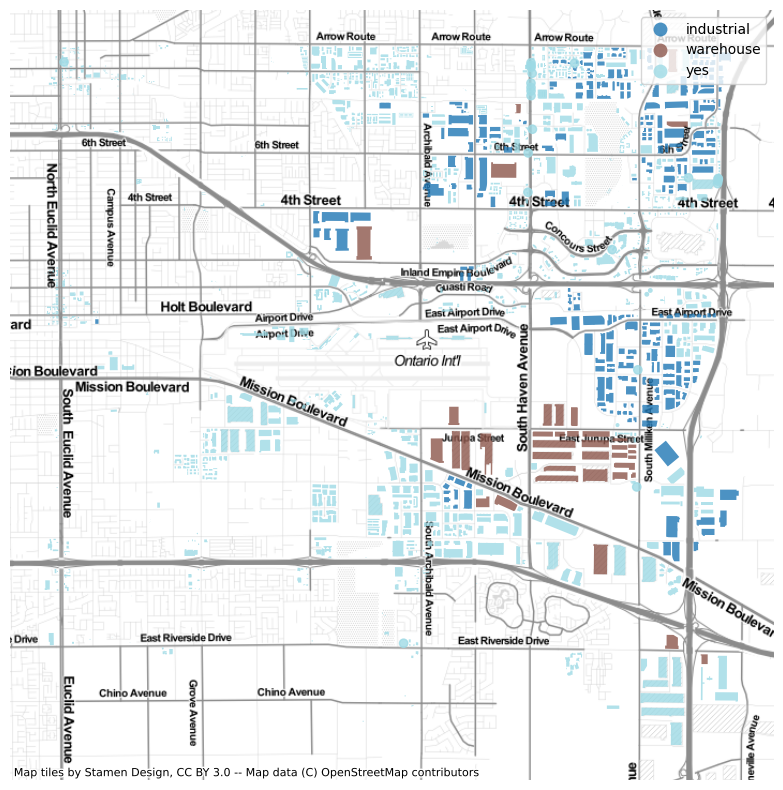

In [43]:
#adding a basemap
fig,ax=mplt.subplots(figsize=(10,10))
osm_wm.plot(ax=ax,
            column='building',
            cmap='tab20',
            legend=True,
            alpha=0.8,
           )

ax.axis('off');

ctx.add_basemap(ax=ax,
                source=ctx.providers.Stamen.TonerLite,
                alpha=1
               )

We can see the density and shape of the buildings. 

## Team

**Alejandra Rios**: Repo manager, data collection and cleaning, assist with quantitative analysis, literature review

**Georgie Suico**: Qualitative analysis and literature review, assist with notebook design, quantitative analysis, and data collection

**Jennifer Chu**: Notebook and presentation design, assist with quantitative analysis, literature review, and data collection

**Matthews Cribioli**: Quantitative analysis, assist with qualitative analysis, literature review, and data collection